Compare this implimentation to the one from the official Torch tutorial:
https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

In [140]:
import numpy as np
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data

import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.autograd as autograd
from torch.autograd import Variable
from torch.nn.utils.parametrizations import spectral_norm

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Seed control, for better reproducibility 
# NOTE: this does not gurantee results are always the same
seed = 22
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

if torch.cuda.is_available():
    device = torch.device("cuda:0")
    # work on a single GPU or CPU
    cudnn.benchmark=True
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()
    Tensor = torch.cuda.FloatTensor
else:
    device = torch.device("cpu")
    cudnn.benchmark=False
    Tensor = torch.FloatTensor

print(device)

EPOCHS = 500


cpu


In [2]:
def imshow(img):
    # custom show in order to display
    # torch tensors as numpy
    npimg = img.numpy() / 2 + 0.5 # from tensor to numpy
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

batch_size = 250 # might try to use large batches (we will discuss why later when we talk about BigGAN)
# NOTE: the batch_size should be an integer divisor of the data set size  or torch
# will give you an error regarding batch sizes of "0" when the data loader tries to
# load in the final batch

dataset = dset.CIFAR10(root='data/cifar/', download=True,
                       transform=transforms.Compose([
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                       ]))

# frogs are the sixth class in the dataset 
classes = ['plane', 'car', 'bird', 'cat','deer', 'dog', 'frog', 'horse', 'ship', 'truck']
frog = 6
frog_index = [i for i, x in enumerate(dataset.targets) if x == 6]
print("number of frog imgs: ", len(frog_index))

frog_set = torch.utils.data.Subset(dataset, frog_index)


dataloader = torch.utils.data.DataLoader(frog_set, batch_size=batch_size,
                                         shuffle=True, num_workers=1)

Files already downloaded and verified
number of frog imgs:  5000


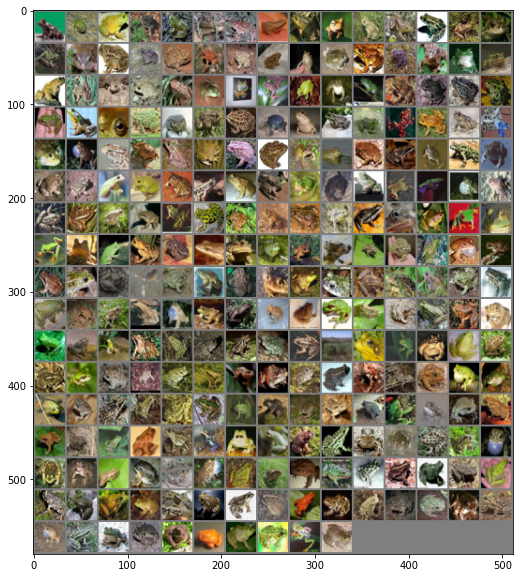

Image shape:  torch.Size([3, 32, 32])


In [3]:
# get some random training images
dataiter = iter(dataloader)
real_image_examples, _ = next(dataiter)

# show images
plt.figure(figsize=(10,10))
imshow(torchvision.utils.make_grid(real_image_examples, nrow=int(np.sqrt(batch_size))))
print("Image shape: ", real_image_examples[0].size())


In [4]:
# create Utils functions for saving and loading 
def save_checkpoint(new_img_list, loaded_ims, g_model, d_model, file_prefix):
    # save off a checkpoint of the current models and images
    
    # convert to numpy images for saving
    ims = np.array([np.transpose(np.hstack((i,real_image_numpy)), (2,1,0)) for i in new_img_list])
    
    # if we have saved images from another run, concatenate and save them here
    if len(loaded_ims)>0:
        ims = np.concatenate((loaded_ims,ims)) # concatenate these images with other runs (if needed)
        
    np.save(f'models/gan_models/{file_prefix}_images.npy',ims)

    # save the state of the models (will need to recreate upon reloading)
    torch.save({'state_dict': g_model.state_dict()}, f'models/gan_models/{file_prefix}_gen.pth')
    torch.save({'state_dict': d_model.state_dict()}, f'models/gan_models/{file_prefix}_dis.pth')
   
def load_checkpoint(file_prefix, gen_func, disc_func):
    # load up checkpoint images from previous runs
    ims = np.load(f'models/gan_models/{file_prefix}_images.npy')

    generator = gen_func() # create generator (no weights)
    discriminator = disc_func() # create disciminator (no weights)

    # now populate the weights from a previous training
    checkpoint = torch.load(f'models/gan_models/{file_prefix}_gen.pth')
    generator.load_state_dict(checkpoint['state_dict'])

    checkpoint = torch.load(f'models/gan_models/{file_prefix}_dis.pth')
    discriminator.load_state_dict(checkpoint['state_dict'])
    
    return ims, generator, discriminator
    

# Vanilla Generative Adversarial Networks
In this implementation of GANS, we will use a few of the tricks from F. Chollet and from Salimans et al. In particular, we will add some noise to the labels. 

>[3 points] First, look at the code for the generator and discriminator/critic. Adjust the architecture to also sample from one hot encodings and use embeddings of class encodings (like in the LS-GAN paper). Use this same one hot encoding (both sampled and from the actual classes) in the discriminator/critic.  This GAN will be your base implementation--run this for at least 500 epochs (ideally more). 

In the below code provided to us, we adjust the vanilla Generator and Discriminator by adding an Embedding layer based on the number of classes in this dataset.  Per the above code before this section, the number of classes were outlined to us in the "classes" variable.  We have 10 classes.  We use the length of this variable to construct our embedding class.

In [5]:
latent_dim = 32
height = 32
width = 32
channels = 3
NUM_CLASSES = len(classes)

# Note: according to Radford (2016), is there anything done here
# that potentially could have been different? 
# Anything wrong here based on Radford paper???
# NOTE: Dr. Larson Fixed most errors here for understanding

class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()
        # save these two functions

        # First, transform the input into a 8x8 128-channels feature map
        self.init_size = width // 4 # one quarter the image size 

        # MODIFICATION: add embedding layer here
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        # MODIFICATION: need to increase latent space to include OHE classes
        self.l1 = nn.Sequential(nn.Linear(latent_dim + NUM_CLASSES, 128 * self.init_size ** 2))
        # there is no reshape layer, this will be done in forward function
        # alternately we could us only the functional API
        # and bypass sequential altogether

        # we will use the sequential API
        # in order to create some blocks
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False), #16x16
            nn.Conv2d(128, 128, 3, padding=1), #16x16

            # Then, add a convolution layer
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            # Upsample to 32x32
            # Transpose is not causing problems, but is slowing down because stride default 1
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False), # 32x32
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            #nn.ConvTranspose2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            # Produce a 32x32xRGB-channel feature map
            nn.Conv2d(64, channels, kernel_size=3, padding=1),
            nn.Tanh(),
        )

    # MODIFICATION: labels need to be encoded here
    def forward(self, z, labels):

        # MODIFICATION: convert labels
        labels_embedded = self.e1(labels)

        # MODIFICATION: concat z, labels vectors
        z = torch.cat([z, labels_embedded], dim=1)

        # call the functions from earlier:
        # expand the sampled z to 8x8
        out = self.l1(z)
        out = torch.reshape(out, (out.shape[0], 128, self.init_size, self.init_size))
        # use the view function to reshape the layer output
        #  old way for earlier Torch versions: out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

In [6]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        self.model = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.3, inplace=True),
            nn.BatchNorm2d(32),

            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(128),
        )

        # The height and width of downsampled image
        ds_size = width // 2 ** 4
        # Classification layer
        # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1), 
                                                  nn.Sigmoid())

    # MODIFICATION: labels need to be encoded here
    def forward(self, img, labels):

        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        validity = self.classification_layer(out)
        return validity

In [7]:
# custom weights initialization called on netG and netD
# this function from PyTorch's officail DCGAN example:
# https://github.com/pytorch/examples/blob/master/dcgan/main.py#L112
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02) # filters are zero mean, small STDev
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02) # batch norm is unit mean, small STDev
        # gamma starts around 1
        m.bias.data.fill_(0) # like normal, biases start at zero
        # beta starts around zero
    elif isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.01)

In [8]:
generator = Generator()
discriminator = Discriminator()

In [9]:
# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# Could these be AdaM? Would that improve performance? :) 
# Decay rate here might be a tad aggressive...
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=0.0004, weight_decay=1e-8)

# THIS LINE OF CODE DEFINES THE FUNCTION WE WILL USE AS LOSS
adversarial_loss = torch.nn.BCELoss() # binary cross entropy 


In [10]:
generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (classification_layer): Sequential(
    (0): Linear(in_features=522, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

In [11]:
iterations = EPOCHS

# Sample random points in the latent space

# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))

In [12]:
%%time

# MODIFICATION: added lists to capture data
generator_loss = []
discriminator_loss = []

# optionally load the checkpoint data here from previous run
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('vanilla', 
                                                       Generator, 
                                                       Discriminator)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

# Start training loop
for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()
    
    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
        
        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get BCE Loss function
        # E[log d(x_fake)]
        # want generator output to generate images that are "close" to all "ones" 

        # MODIFICATION: Added labels to the discriminator class
        g_loss = adversarial_loss(discriminator(generated_images, labels=torch_labels), misleading_targets)

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])

        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (because we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))

        # Add small random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of BCE(real images labeled as real) + BCE(fake images labeled as fake)
        #  E[log d(x_real)] + E[log 1- d(x_fake)]

        # MODIFICATION: Added labels to the discriminator class
        d_loss = (
            adversarial_loss(discriminator(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            adversarial_loss(discriminator(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================
        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss.append(g_loss.item())
    discriminator_loss.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        # Print metrics (TODO: these are actually binary cross entropy, not Disc outputs..)
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        
        # save images in a list for display later
        with torch.no_grad():

            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'vanilla_OHE')

Loss at step 1: D(z_c)=0.5708526372909546, D(G(z_mis))=0.7166510224342346
Loss at step 11: D(z_c)=0.71556556224823, D(G(z_mis))=0.5229026079177856
Loss at step 21: D(z_c)=0.7239134907722473, D(G(z_mis))=1.655880331993103
Loss at step 31: D(z_c)=0.7280876040458679, D(G(z_mis))=0.399390310049057
Loss at step 41: D(z_c)=0.6665458083152771, D(G(z_mis))=0.6534435749053955
Loss at step 51: D(z_c)=0.7184845805168152, D(G(z_mis))=0.4124085009098053
Loss at step 61: D(z_c)=0.7152575254440308, D(G(z_mis))=0.41458216309547424
Loss at step 71: D(z_c)=0.6670949459075928, D(G(z_mis))=0.5634815096855164
Loss at step 81: D(z_c)=0.6978656649589539, D(G(z_mis))=1.8210898637771606
Loss at step 91: D(z_c)=0.6832985877990723, D(G(z_mis))=1.1855686902999878
Loss at step 101: D(z_c)=0.20577004551887512, D(G(z_mis))=3.3113577365875244
Loss at step 111: D(z_c)=0.46811723709106445, D(G(z_mis))=1.3881994485855103
Loss at step 121: D(z_c)=0.372779905796051, D(G(z_mis))=1.8279961347579956
Loss at step 131: D(z_c)=

## Model Checkpointing
Let's load up a previous run and see how the images evolved over the run. The blocks below use the state_dict property to save and load data. The second block is nice for running this notebook only to show the results of a previous run. 

In [13]:
# save off everything at the end (same as the checkpoint)
save_checkpoint(img_list, loaded_ims, generator, discriminator, 'vanilla_OHE')

In [14]:
# load the models (nice for showing results from previous run)
ims, generator, discriminator = load_checkpoint('vanilla_OHE', Generator, Discriminator)

C:\Users\EV-04\AppData\Local\Temp/ipykernel_11232/1727329474.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.float)


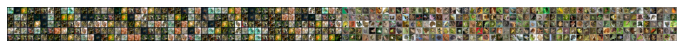

In [15]:
def norm_grid(im):
    # first half should be normalized and second half also, separately
    im = im.astype(np.float)
    rows,cols,chan = im.shape
    cols_over2 = int(cols/2)
    tmp = im[:,:cols_over2,:]
    im[:,:cols_over2,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    tmp = im[:,cols_over2:,:]
    im[:,cols_over2:,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    return im

      
fig = plt.figure(figsize=(12,4))
plt.axis("off")  
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

We are getting something that is similar to a frog, but also we are seeing a bit of mode collapse. The global properties of a greenish or gray blob surrounded by various background is starting to comes across. However, the finer structure is not doing too well. That is, the legs and details in the background are not present yet. 

To improve this result, there are a number of things we might try such as:
- Using the Radford guided methods (implemented already in 2022)
- Adding more randomization to the optimizer
- Running the discriminator multiple times for each generator update
- Changing the objective function (let's try this one)

____
# Least Squares GAN
Actually, the only thing we need to do here is replace the adversarial loss function. Note that we are NOT going to make additions to the architecture where the one hot encoding of the classes (and random classes) are used in both the generator and discriminator. This means that we might see a bit more mode collapse in our implementation. 

In [16]:
generator = Generator()
discriminator = Discriminator()


# LSGAN paper says they use ADAM, but follow up papers say RMSProp is slightly better
#lr = 0.0002
#betas = (0.5, 0.999)

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), 
                                    lr=0.0004, weight_decay=1e-8)

# used to be: adversarial_loss = torch.nn.BCELoss() # binary cross entropy 
adversarial_loss = torch.nn.MSELoss() # mean squared error loss 

generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (classification_layer): Sequential(
    (0): Linear(in_features=522, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

In [20]:
iterations = EPOCHS #defined above

# Sample random points in the latent space
# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))


In [21]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_LS = []
discriminator_loss_LS = []

# code is the exact same as above, no need to change it
# because we have changed the adversarial loss function
# Start training loop

# Becasue not much is changing, an interesting update would
# be to write a "train step" function and use it here.
# Something like: train_step(g, d, imgs, loss_select=MSE, num_d_steps=1)

run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('ls', 
                                                       Generator, 
                                                       Discriminator)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()

    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))

        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        # misleading target, c=1
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get MSE Loss function
        # want generator output to generate images that are "close" to all "ones" 
        
        # MODIFICATION: Added labels to the discriminator class
        g_loss = adversarial_loss(discriminator(generated_images, labels=torch_labels), misleading_targets)

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])
        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (becasue we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        # real label, a=1 and fake label, b=0
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))
        # Add random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of MSE(real images labeled as real) + MSE(fake images labeled as fake)
        # MODIFICATION: Added labels to the discriminator class
        d_loss = (
            adversarial_loss(discriminator(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            adversarial_loss(discriminator(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================
        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss_LS.append(g_loss.item())
    discriminator_loss_LS.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        
        # Print metrics
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        # save images in a list for display later
        with torch.no_grad():
            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'ls')

Loss at step 1: D(z_c)=0.25705820322036743, D(G(z_mis))=0.788824200630188
Loss at step 11: D(z_c)=0.18674880266189575, D(G(z_mis))=0.31866171956062317
Loss at step 21: D(z_c)=0.20029643177986145, D(G(z_mis))=0.47889241576194763
Loss at step 31: D(z_c)=0.250857949256897, D(G(z_mis))=0.13912002742290497
Loss at step 41: D(z_c)=0.26691004633903503, D(G(z_mis))=0.12807682156562805
Loss at step 51: D(z_c)=0.16431564092636108, D(G(z_mis))=0.2971164584159851
Loss at step 61: D(z_c)=0.14117544889450073, D(G(z_mis))=0.617152214050293
Loss at step 71: D(z_c)=0.1685798168182373, D(G(z_mis))=0.43804922699928284
Loss at step 81: D(z_c)=0.2233918309211731, D(G(z_mis))=0.40726086497306824
Loss at step 91: D(z_c)=0.3012216091156006, D(G(z_mis))=0.4904077351093292
Loss at step 101: D(z_c)=0.11562211811542511, D(G(z_mis))=0.44139108061790466
Loss at step 111: D(z_c)=0.01069657038897276, D(G(z_mis))=0.841158926486969
Loss at step 121: D(z_c)=0.052671972662210464, D(G(z_mis))=0.4883235991001129
Loss at st

In [22]:
save_checkpoint(img_list, loaded_ims, generator, discriminator, 'ls')

In [23]:
# Load up a run, if you want 
ims, generator, discriminator = load_checkpoint('ls', Generator, Discriminator)

C:\Users\EV-04\AppData\Local\Temp/ipykernel_11232/1727329474.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.float)


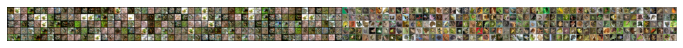

In [24]:
fig = plt.figure(figsize=(12,4))
plt.axis("off")  
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

Well, these results are not exactly a great imprvment. Mode collapse is more apparent here as well, but the fine structure of the frogs is also not quite the improvement that we wanted. Looking back through the iterations, there was some indication of more successful generations. Subjectively, the frogs started to show up, but then generation became slightly worse. We could run this code for many more iterations, and that might work in terms of getting the optimizers to create better distributions. But it is not guaranteed. 

Instead, now let's try using a Wasserstein GAN, where we use the gradient penalty as a method of making the discrminator 1-lipschitz (and therefore a valid critic to approximate the earth mover distance). 

___
# Wasserstein GAN with Gradient Penalty
For this implementation, we need to add functionality to the gradient of the Discriminator to make it a critic. For the most part, we need to add the gradient loss function calculations to match the WGAN-GP.

In [25]:
class WGCritic(nn.Module):

    def __init__(self):
        super(WGCritic, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        self.model = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 32), # group==1 is same as 2d layer norm

            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 64), # group==1 is same as 2d layer norm

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 128), # group==1 is same as 2d layer norm
        )

        # The height and width of downsampled image
        ds_size = width // 2 ** 4
        # Classification layer (just linear for the WGAN, critic)
        # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1))

    def forward(self, img, labels):
        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        validity = self.classification_layer(out)
        return validity

In [26]:
# Initialize generator and discriminator
generator = Generator() # same generator, with new discriminator
discriminator = WGCritic()

# params from WGAN-GP paper
# learning rate
lr = 0.0001
beta1 = 0
beta2 = 0.9
# number of training steps for discriminator per iter for WGANGP
n_critic = 5
# Loss weight for gradient penalty
lambda_gp = 10

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1

# Optimizers, no loss function defined here as
# will use torch.mean as loss function for WGAN.

 
# discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), lr=lr)
# gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=lr)

# Use ADAM 
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                              lr=lr, betas=(beta1, beta2))
gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                    lr=lr, betas=(beta1, beta2))


# History: This worked okay with RMSProp and Batch norm/dropout in the critic
#. Attempt 1 to improve: took out batch norm, dropout, and started using Adam (bad results)
#. Attempt 2 to improve: took out batch norm, dropout, and started using RMSProp (working from previous gen/critic, awful results)
#. Attempt 3: Mirrored more from the WGAN-GP paper (LayerNorm and Adam, w/ beta1=0)

This compute_gradient_penalty function for WGAN-GP comes from https://github.com/eriklindernoren/PyTorch-GAN/blob/master/implementations/wgan_gp/wgan_gp.py#L119.

In [40]:
def compute_gradient_penalty(D, real_samples, fake_samples, labels):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    epsilon = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    
    # Get random interpolation between real and fake samples
    interpolates = (epsilon * real_samples + ((1 - epsilon) * fake_samples)).requires_grad_(True)

    # MODIFICATION: Added labels here    
    d_interpolates = D(img=interpolates, labels=labels)
    fake = Variable(Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    
    # Get gradient w.r.t. interpolates
    # Computes and returns the sum of gradients of outputs with respect to the inputs.
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake, #  Jacobian vector product, if applicable. Documentation says pass in all ones (w/ no gradients) if not used
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0] # zero element is the sum for each of the interpolates
    
    # flatten gradients
    # same as this: gradients = gradients.view(gradients.size(0), -1)
    gradients = torch.flatten(gradients, start_dim=1) # don't flatten over batch size
    
    #. nowsize is batch x gradient size
    # use norm approx equal to one, as stated in paper. Rather than <1.
    # collapse norm across the batch, then take mean of each batch - 1
    # Using L2 norm of gradient
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

In [41]:
iterations = EPOCHS #defined above

# Sample random points in the latent space
# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))



In [42]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_WGAN = []
discriminator_loss_WGAN = []

#   we can continue a longer training run. 
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('wgan', 
                                                       Generator, 
                                                       WGCritic)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints
    # Use ADAM 
    discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                                  lr=lr, betas=(beta1, beta2))
    gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                        lr=lr, betas=(beta1, beta2))

for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()

    # MODIFICATION: add idx tracker
    idx = 0
    
    for i, (imgs, _) in enumerate(dataloader):
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        
        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
       
        # Decode them to fake images
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)
        
        # Compute gradient penalty
        # MODIFICATION: add labels to discriminator
        gradient_penalty = compute_gradient_penalty(discriminator, real_images.data, generated_images.data, labels=torch_labels)
        
        # MODIFICATION: Added labels to the discriminator class
        # minimize this, 
        d_loss = -torch.mean(discriminator(real_images, labels=torch_labels)) + \
                  torch.mean(discriminator(generated_images, labels=torch_labels)) + \
                  lambda_gp * gradient_penalty

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()
        
        #===================================
        
        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Train the generator for every n_critic iterations
        if i % n_critic == 0:
            # Decode them to fake images, through the generator
            # MODIFICATION: Added labels to the generator class
            generated_images = generator(random_latent_vectors, labels=torch_labels)

            # Adversarial loss from critic
            # MODIFICATION: Added labels to the discriminator class
            g_loss = -torch.mean(discriminator(generated_images, labels=torch_labels))

            # now back propagate to get derivatives
            g_loss.backward()

            # use gan optimizer to only update the parameters of the generator
            # this was setup above to only use the params of generator
            gan_optimizer.step()
        
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)

    # MODIFICATION: capture generator and discriminator loss
    generator_loss_WGAN.append(g_loss.item())
    discriminator_loss_WGAN.append(d_loss.item())
        
    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        
        # Print metrics
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        # save images in a list for display later
        with torch.no_grad():
            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'wgan')
        

Loss at step 1: D(z_c)=-0.10801053047180176, D(G(z_mis))=-0.4261828064918518
Loss at step 11: D(z_c)=-0.4592467248439789, D(G(z_mis))=2.5084688663482666
Loss at step 21: D(z_c)=-0.43619704246520996, D(G(z_mis))=3.163755416870117
Loss at step 31: D(z_c)=-0.7855306267738342, D(G(z_mis))=4.160749435424805
Loss at step 41: D(z_c)=-0.8569346070289612, D(G(z_mis))=5.021786212921143
Loss at step 51: D(z_c)=-0.6263440251350403, D(G(z_mis))=5.949192047119141
Loss at step 61: D(z_c)=-0.31871113181114197, D(G(z_mis))=7.542900085449219
Loss at step 71: D(z_c)=-0.3746788203716278, D(G(z_mis))=6.1629204750061035
Loss at step 81: D(z_c)=-0.3855292499065399, D(G(z_mis))=7.20645809173584
Loss at step 91: D(z_c)=-0.3092442750930786, D(G(z_mis))=8.329498291015625
Loss at step 101: D(z_c)=-0.37743619084358215, D(G(z_mis))=7.204614639282227
Loss at step 111: D(z_c)=-0.40614646673202515, D(G(z_mis))=8.518003463745117
Loss at step 121: D(z_c)=-0.46150654554367065, D(G(z_mis))=8.433248519897461
Loss at step 1

In [43]:
ims, generator, discriminator = load_checkpoint('wgan', Generator, WGCritic)

C:\Users\EV-04\AppData\Local\Temp/ipykernel_11232/1727329474.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.float)


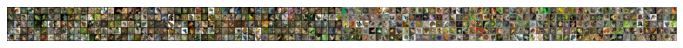

In [44]:
fig = plt.figure(figsize=(12,4))
plt.axis("off")  
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

The WGAN-GP seem to be a bit better (on some runs) for finding more divers backgrounds. You can also notice that one of the runs seems to start finding legs, which is something the other methods struggled with. 

# Feature Matching
>[4 points]  Implement one item from the list in the GAN training and generate samples of your dataset images. Explain the method you are using and what you hypothesize will occur with the results.  Train the GAN running for at least 500 epochs. Subjectively, did this improve the generated results? Did training time increase or decrease and by how much? Explain. 
    

In [132]:
class Discriminator_FM(nn.Module):

    def __init__(self):
        super(Discriminator_FM, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        self.model = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.3, inplace=True),
            nn.BatchNorm2d(32),

            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(128),
        )

        # # The height and width of downsampled image
        # ds_size = width // 2 ** 4
        # # Classification layer
        # # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        # self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1), 
        #                                           nn.Sigmoid())

    # MODIFICATION: labels need to be encoded here
    def forward(self, img, labels):

        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        return out
        # validity = self.classification_layer(out)
        # return validity

In [134]:
generator = Generator()
discriminator_fm = Discriminator_FM()

In [135]:
# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# Could these be AdaM? Would that improve performance? :) 
# Decay rate here might be a tad aggressive...
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator_fm.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=0.0004, weight_decay=1e-8)

# THIS LINE OF CODE DEFINES THE FUNCTION WE WILL USE AS LOSS
adversarial_loss = torch.nn.BCELoss() # binary cross entropy 

# MODIFICATION: added a feature loss function for feature mapping
feature_loss_fn = torch.nn.MSELoss()


In [136]:
generator.apply(weights_init)
discriminator_fm.apply(weights_init)

Discriminator_FM(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)

In [137]:
iterations = EPOCHS

# Sample random points in the latent space

# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))

In [138]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_FM = []
discriminator_loss_FM = []

# optionally load the checkpoint data here from previous run
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator_fm = load_checkpoint('vanilla_FM', 
                                                       Generator, 
                                                       Discriminator_FM)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

# Start training loop
for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator_fm.train()
    
    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
        
        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get BCE Loss function
        # E[log d(x_fake)]
        # want generator output to generate images that are "close" to all "ones" 

        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])

        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (because we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))

        # Add small random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of BCE(real images labeled as real) + BCE(fake images labeled as fake)
        #  E[log d(x_real)] + E[log 1- d(x_fake)]

        # MODIFICATION: Added labels to the discriminator class
        # d_loss = (
        #     adversarial_loss(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
        #     adversarial_loss(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
        #     ) / 2
        d_loss = (
            feature_loss_fn(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            feature_loss_fn(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()

        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator_fm.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================

        # UPDATE GENERATOR

        # MODIFICATION: Added labels to the discriminator class, generator loss needs to be on what discriminator thinks is real vs fake features
        g_loss = feature_loss_fn(discriminator_fm(real_images, labels=torch_labels), discriminator_fm(generated_images, labels=torch_labels))

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()
        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss_FM.append(g_loss.item())
    discriminator_loss_FM.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator_fm.eval()
        # Print metrics (TODO: these are actually binary cross entropy, not Disc outputs..)
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        
        # save images in a list for display later
        with torch.no_grad():

            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator_fm, 'vanilla_FM')

Loss at step 1: D(z_c)=1.3340433835983276, D(G(z_mis))=1.7308144569396973
Loss at step 11: D(z_c)=0.8672225475311279, D(G(z_mis))=0.9766377210617065
Loss at step 21: D(z_c)=0.619825005531311, D(G(z_mis))=0.7365186810493469
Loss at step 31: D(z_c)=0.45533287525177, D(G(z_mis))=0.3491266667842865
Loss at step 41: D(z_c)=0.3504768908023834, D(G(z_mis))=0.18455612659454346
Loss at step 51: D(z_c)=0.2874964475631714, D(G(z_mis))=0.06955955922603607
Loss at step 61: D(z_c)=0.25706925988197327, D(G(z_mis))=0.011271597817540169
Loss at step 71: D(z_c)=0.2517079710960388, D(G(z_mis))=0.0004407084488775581
Loss at step 81: D(z_c)=0.25109878182411194, D(G(z_mis))=2.1012591844282724e-07
Loss at step 91: D(z_c)=0.2496238648891449, D(G(z_mis))=5.958559201602043e-10
Loss at step 101: D(z_c)=0.24920064210891724, D(G(z_mis))=6.760907922398474e-08
Loss at step 111: D(z_c)=0.2506355345249176, D(G(z_mis))=3.5602803905021574e-07
Loss at step 121: D(z_c)=0.25039732456207275, D(G(z_mis))=1.365744992654072e-0

In this example, we define the discriminator to output five intermediate feature maps, which are used to compute the feature matching loss in the generator loss function. During training, we first train the discriminator on real and fake data, then train the generator to minimize the feature matching loss between the real and fake features. The `feature_matching_loss` function computes the mean squared error between the mean of each real and fake feature map. Note that we exclude the last feature map from the feature matching loss, as it is used to compute the adversarial loss. 

You can modify the number of intermediate feature maps and other hyperparameters to suit your specific GAN architecture and training needs.

# Historical Averaging
>[4 points] Implement ANOTHER item in the list in the GAN training and generate samples of your dataset images.  Repeat the previous step. You can add this to your previous implementation or run this in isolation as you prefer. 
    

In [160]:
generator = Generator()
discriminator_fm = Discriminator_FM()

In [161]:
# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since 
                 # PyTorch didn't has the feature to set clipvalue for 
                 # RMSprop optimizer.
        
# Could these be AdaM? Would that improve performance? :) 
# Decay rate here might be a tad aggressive...
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator_fm.parameters(), 
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=0.0004, weight_decay=1e-8)

# THIS LINE OF CODE DEFINES THE FUNCTION WE WILL USE AS LOSS
adversarial_loss = torch.nn.BCELoss() # binary cross entropy 

# MODIFICATION: added a feature loss function for feature mapping
feature_loss_fn = torch.nn.MSELoss()


In [162]:
generator.apply(weights_init)
discriminator_fm.apply(weights_init)

Discriminator_FM(
  (e1): Embedding(10, 10)
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)

In [163]:
iterations = EPOCHS

# Sample random points in the latent space

# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))

In [164]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_FM_HA = []
discriminator_loss_FM_HA = []

# MODIFICATION: add list to capture Historical Weights
generator_historical_weights = []

# optionally load the checkpoint data here from previous run
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator_fm = load_checkpoint('vanilla_FM_HA', 
                                                       Generator, 
                                                       Discriminator_FM)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

# Start training loop
for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator_fm.train()
    
    # MODIFICATION: add idx tracker
    idx = 0

    for i, (imgs, _) in enumerate(dataloader):


        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
        
        # Decode them to fake images, through the generator
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)

        # Assemble labels that say "all real images"
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get BCE Loss function
        # E[log d(x_fake)]
        # want generator output to generate images that are "close" to all "ones" 

        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        combined_images = torch.cat([real_images, generated_images.detach()])

        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated 
        # those parameters wouldn't be updated (because we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        labels = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)
        ))

        # Add small random noise to the labels - important trick!
        labels += 0.05 * torch.rand(labels.shape)

        # Setup Discriminator loss
        # this takes the average of BCE(real images labeled as real) + BCE(fake images labeled as fake)
        #  E[log d(x_real)] + E[log 1- d(x_fake)]

        # MODIFICATION: Added labels to the discriminator class
        # d_loss = (
        #     adversarial_loss(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
        #     adversarial_loss(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
        #     ) / 2
        d_loss = (
            feature_loss_fn(discriminator_fm(combined_images[:batch_size], labels=torch_labels), labels[:batch_size]) + \
            feature_loss_fn(discriminator_fm(combined_images[batch_size:], labels=torch_labels), labels[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()

        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator_fm.parameters():
            p.data.clamp_(-clip_value, clip_value)
            
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)
        #===================================

        # UPDATE GENERATOR

        # MODIFICATION: Added labels to the discriminator class, generator loss needs to be on what discriminator thinks is real vs fake features
        g_loss = feature_loss_fn(discriminator_fm(real_images, labels=torch_labels), discriminator_fm(generated_images, labels=torch_labels))

        # now back propagate to get derivatives
        g_loss.backward()
        
        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()

        # MODIFICATION: Extract weights from generator
        generator_current_weights = [weights.data.clone() for weights in generator.parameters()]
        generator_historical_weights.append(generator_current_weights)

        # MODIFICATION: calculate average weights
        generator_average_weights = [sum(weight_v)/len(weight_v) for weight_v in zip(*generator_historical_weights, generator_current_weights)]

        # MODIFICATION: update weights in generator with avg
        for idx, weights in enumerate(generator.parameters()):
            weights.data = generator_average_weights[idx]

        
    # MODIFICATION: capture generator and discriminator loss
    generator_loss_FM_HA.append(g_loss.item())
    discriminator_loss_FM_HA.append(d_loss.item())

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator_fm.eval()
        # Print metrics (TODO: these are actually binary cross entropy, not Disc outputs..)
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        
        # save images in a list for display later
        with torch.no_grad():

            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator_fm, 'vanilla_FM_HA')

Loss at step 1: D(z_c)=1.3346552848815918, D(G(z_mis))=1.7202421426773071
Loss at step 11: D(z_c)=0.8693279027938843, D(G(z_mis))=1.1656196117401123
Loss at step 21: D(z_c)=0.6186543703079224, D(G(z_mis))=0.6043765544891357
Loss at step 31: D(z_c)=0.4553007483482361, D(G(z_mis))=0.4185120463371277
Loss at step 41: D(z_c)=0.3494327962398529, D(G(z_mis))=0.19130924344062805
Loss at step 51: D(z_c)=0.28741729259490967, D(G(z_mis))=0.07021953165531158
Loss at step 61: D(z_c)=0.25799909234046936, D(G(z_mis))=0.011323032900691032
Loss at step 71: D(z_c)=0.25080275535583496, D(G(z_mis))=0.0005175081314519048
Loss at step 81: D(z_c)=0.2501135766506195, D(G(z_mis))=1.3945883381438762e-07
Loss at step 91: D(z_c)=0.24957430362701416, D(G(z_mis))=3.121455094401426e-08
Loss at step 101: D(z_c)=0.25100213289260864, D(G(z_mis))=1.5190803281939225e-08
Loss at step 111: D(z_c)=0.2505834400653839, D(G(z_mis))=1.2430731999302225e-08
Loss at step 121: D(z_c)=0.24951837956905365, D(G(z_mis))=1.281386374785

# Spectral Normalization for Wasserstein

>[4 points] Implement ANOTHER item in the list in the GAN training and generate samples of your dataset images. Repeat the previous step. You can add this to your previous implementation or run this in isolation as you prefer. 


In [165]:
class WGCritic_SN(nn.Module):

    def __init__(self):
        super(WGCritic_SN, self).__init__()

        # MODIFICATION: Added embedding layer
        self.e1 = nn.Embedding(NUM_CLASSES, NUM_CLASSES)

        # MODIFICATION: Added Spectral Norm Function
        self.model = nn.Sequential(
            spectral_norm(nn.Conv2d(3, 16, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),

            spectral_norm(nn.Conv2d(16, 32, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 32), # group==1 is same as 2d layer norm

            spectral_norm(nn.Conv2d(32, 64, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 64), # group==1 is same as 2d layer norm

            spectral_norm(nn.Conv2d(64, 128, 3, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.GroupNorm(1, 128), # group==1 is same as 2d layer norm
        )

        # The height and width of downsampled image
        ds_size = width // 2 ** 4
        # Classification layer (just linear for the WGAN, critic)
        # MODIFICATION: add NUM_CLASSES to input size for linear layer to align dimension sizes
        self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2 + NUM_CLASSES, 1))

    def forward(self, img, labels):
        out = self.model(img)
        # use the view function to flatten the layer output
        #    old way for earlier Torch versions: out = out.view(out.shape[0], -1)
        out = torch.flatten(out, start_dim=1) # don't flatten over batch size

        # MODIFICATION: embed layers
        embedding = self.e1(labels)

        # Concatenate embedding with output of convolutional layers
        out = torch.cat([out, embedding], dim=1)

        validity = self.classification_layer(out)
        return validity

In [166]:
# Initialize generator and discriminator
generator = Generator() # same generator, with new discriminator
discriminator = WGCritic_SN()

# params from WGAN-GP paper
# learning rate
lr = 0.0001
beta1 = 0
beta2 = 0.9
# number of training steps for discriminator per iter for WGANGP
n_critic = 5
# Loss weight for gradient penalty
lambda_gp = 10

# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1

# Optimizers, no loss function defined here as
# will use torch.mean as loss function for WGAN.

 
# discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(), lr=lr)
# gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=lr)

# Use ADAM 
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                              lr=lr, betas=(beta1, beta2))
gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                    lr=lr, betas=(beta1, beta2))


# History: This worked okay with RMSProp and Batch norm/dropout in the critic
#. Attempt 1 to improve: took out batch norm, dropout, and started using Adam (bad results)
#. Attempt 2 to improve: took out batch norm, dropout, and started using RMSProp (working from previous gen/critic, awful results)
#. Attempt 3: Mirrored more from the WGAN-GP paper (LayerNorm and Adam, w/ beta1=0)

In [167]:
iterations = EPOCHS #defined above

# Sample random points in the latent space
# MODIFICATION: need to increase plot_num_examples to be same dim size for labels
plot_num_examples = 250
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))



In [168]:
%%time

# MODIFICATION: added lists to capture data
generator_loss_SN = []
discriminator_loss_SN = []

#   we can continue a longer training run. 
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('SN', 
                                                       Generator, 
                                                       WGCritic_SN)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints
    # Use ADAM 
    discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), 
                                                  lr=lr, betas=(beta1, beta2))
    gan_optimizer = torch.optim.Adam(generator.parameters(), 
                                        lr=lr, betas=(beta1, beta2))

for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()

    # MODIFICATION: add idx tracker
    idx = 0
    
    for i, (imgs, _) in enumerate(dataloader):
        
        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))
        
        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))
       
        # Decode them to fake images
        # MODIFICATION: get labels and convert to tensor for input into generator
        torch_labels = torch.tensor(dataset.targets[idx:idx + len(imgs)])
        generated_images = generator(random_latent_vectors, labels=torch_labels)
        
        # Compute gradient penalty
        # MODIFICATION: add labels to discriminator
        gradient_penalty = compute_gradient_penalty(discriminator, real_images.data, generated_images.data, labels=torch_labels)
        
        # MODIFICATION: Added labels to the discriminator class
        # minimize this, 
        d_loss = -torch.mean(discriminator(real_images, labels=torch_labels)) + \
                  torch.mean(discriminator(generated_images, labels=torch_labels)) + \
                  lambda_gp * gradient_penalty

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()
        
        #===================================
        
        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS
        
        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Train the generator for every n_critic iterations
        if i % n_critic == 0:
            # Decode them to fake images, through the generator
            # MODIFICATION: Added labels to the generator class
            generated_images = generator(random_latent_vectors, labels=torch_labels)

            # Adversarial loss from critic
            # MODIFICATION: Added labels to the discriminator class
            g_loss = -torch.mean(discriminator(generated_images, labels=torch_labels))

            # now back propagate to get derivatives
            g_loss.backward()

            # use gan optimizer to only update the parameters of the generator
            # this was setup above to only use the params of generator
            gan_optimizer.step()
        
        # MODIFICATION: increase idx to next batch
        idx += len(imgs)

    # MODIFICATION: capture generator and discriminator loss
    generator_loss_SN.append(g_loss.item())
    discriminator_loss_SN.append(d_loss.item())
        
    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        
        # Print metrics
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))
        # save images in a list for display later
        with torch.no_grad():
            # MODIFICATION: Added labels to the generator class
            fake_output = generator(fixed_random_latent_vectors, labels=torch_labels).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))
        
        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'SN')
        

Loss at step 1: D(z_c)=-0.4844430088996887, D(G(z_mis))=-0.10030931234359741
Loss at step 11: D(z_c)=-0.3349655866622925, D(G(z_mis))=1.1929876804351807
Loss at step 21: D(z_c)=-0.32708245515823364, D(G(z_mis))=1.6878620386123657
Loss at step 31: D(z_c)=-0.5457710027694702, D(G(z_mis))=1.481735110282898
Loss at step 41: D(z_c)=-0.8308297991752625, D(G(z_mis))=2.5493264198303223
Loss at step 51: D(z_c)=-0.8301206231117249, D(G(z_mis))=3.299809217453003
Loss at step 61: D(z_c)=-0.5219630002975464, D(G(z_mis))=3.424570322036743
Loss at step 71: D(z_c)=-0.18893752992153168, D(G(z_mis))=3.8640551567077637
Loss at step 81: D(z_c)=-0.28124862909317017, D(G(z_mis))=5.2484307289123535
Loss at step 91: D(z_c)=-0.38266852498054504, D(G(z_mis))=5.184265613555908
Loss at step 101: D(z_c)=-0.3359275460243225, D(G(z_mis))=5.617824077606201
Loss at step 111: D(z_c)=-0.33105412125587463, D(G(z_mis))=6.374204158782959
Loss at step 121: D(z_c)=-0.4194491505622864, D(G(z_mis))=6.332289218902588
Loss at st